In [1]:
!date

Tue Nov  8 13:57:18 PST 2022


In [2]:
#Datasets too large to be run on Colab

In [3]:
import requests
import os


In [ ]:
#Download datasets




from tqdm import tnrange, tqdm_notebook
def download_file(doi,ext):
	url = 'https://api.datacite.org/dois/'+doi+'/media'
	r = requests.get(url).json()
	netcdf_url = r['data'][0]['attributes']['url']
	r = requests.get(netcdf_url,stream=True)
	#Set file name
	fname = doi.split('/')[-1]+ext
	#Download file with progress bar
	if r.status_code == 403:
		print("File Unavailable")
	if 'content-length' not in r.headers:
		print("Did not get file")
	else:
		with open(fname, 'wb') as f:
			total_length = int(r.headers.get('content-length'))
			pbar = tnrange(int(total_length/1024), unit="B")
			for chunk in r.iter_content(chunk_size=1024):
				if chunk:
					pbar.update()
					f.write(chunk)
		return fname



#SMART-seq VMH data
#metadata.csv
download_file('10.22002/D1.2067','.gz')

#smartseq.mtx (log counts)
download_file('10.22002/D1.2071','.gz')



#MERFISH data
#metadata.csv
download_file('10.22002/D1.2063','.gz')

#counts.h5ad
download_file('10.22002/D1.2064','.gz')

#10x VMH data
#metadata.csv
download_file('10.22002/D1.2065','.gz')

#tenx.mtx (log counts)
download_file('10.22002/D1.2072','.gz')



os.system("gunzip *.gz")



os.system("mv D1.2067 smartmetadata.csv")
os.system("mv D1.2071 smartseq.mtx")

os.system("mv D1.2063 metadata.csv")
os.system("mv D1.2064 counts.h5ad")

os.system("mv D1.2065 tenxmetadata.csv")
os.system("mv D1.2072 tenx.mtx")


#C. elegans data
#Pseudotime Packer & Zhu C. elegans data
#counts.mtx
download_file('10.22002/D1.2060','.gz')

#cells.csv
download_file('10.22002/D1.2061','.gz')

#genes.csv
download_file('10.22002/D1.2062','.gz')

os.system("gunzip *.gz")

os.system("mv D1.2060 wormcounts.mtx")
os.system("mv D1.2061 wormcells.csv")
os.system("mv D1.2062 wormgenes.csv")




In [3]:
#Read in files from NCBI GEO
os.system("wget --quiet https://ftp.ncbi.nlm.nih.gov/geo/series/GSE149nnn/GSE149372/suppl/GSE149372_GSM5068636-GSM5068641_scRNA.MetaData.105.csv.gz")
os.system("wget --quiet https://ftp.ncbi.nlm.nih.gov/geo/series/GSE149nnn/GSE149372/suppl/GSE149372_GSM5068636-GSM5068641_scRNA.normalized.assay105.csv.gz")

os.system("wget --quiet https://ftp.ncbi.nlm.nih.gov/geo/series/GSE149nnn/GSE149372/suppl/GSE149372_GSM5068636-GSM5068641_scRNA.integrated.scaled.assay105.csv.gz")


0

In [4]:
os.system("gunzip *.gz")

0

In [8]:
os.system("git clone https://github.com/hhcho/densvis.git")

fatal: destination path 'densvis' already exists and is not an empty directory.


32768

/home/tchari


In [9]:
%cd ./densvis/densne/


!g++ sptree.cpp densne.cpp densne_main.cpp -o den_sne -O2
import densne

/home/tchari/densvis/densne


In [2]:
%cd ../../

/home/tchari


In [8]:
!gunzip *.gz

gzip: *.gz: No such file or directory


In [9]:
!git clone https://github.com/pachterlab/CP_2023.git

Cloning into 'CP_2022'...
remote: Enumerating objects: 171, done.
remote: Counting objects: 100% (171/171), done.
remote: Compressing objects: 100% (143/143), done.
remote: Total 171 (delta 71), reused 77 (delta 17), pack-reused 0
Receiving objects: 100% (171/171), 55.23 MiB | 29.73 MiB/s, done.
Resolving deltas: 100% (71/71), done.


In [10]:
%cd /home/tchari/CP_2023/scripts

/home/tchari/CP_2022/scripts


In [8]:
# !pip3 install --quiet torch
# !pip3 install --quiet anndata
# !pip3 install --quiet matplotlib
# !pip3 install --quiet scikit-learn
# !pip3 install --quiet torchsummary
# !pip install --quiet scanpy

## **Install Packages**

In [50]:
import networkx as nx
import anndata 
import pandas as pd
import numpy as np

import visualizations as vis
import tools as tl
import random
from sklearn.decomposition import TruncatedSVD
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
from sklearn.neighbors import NeighborhoodComponentsAnalysis, NearestNeighbors
from sklearn.metrics import pairwise_distances
from sklearn.preprocessing import scale
#import torch
import time
import scanpy as sc
import seaborn as sns
import umap
from scipy import stats
import scipy.io as sio
import matplotlib
import matplotlib.patches as patches
import itertools
matplotlib.rc('axes',edgecolor='black')
%matplotlib inline
sc.set_figure_params(dpi=125)
#sns.set_style('white')

In [12]:
sc.set_figure_params(dpi=125)

In [18]:
# import torchvision

# mnist = torchvision.datasets.MNIST(root='.', download=True)

In [17]:
# torch.manual_seed(0)

# mnist_flattened = mnist.data.reshape((mnist.data.shape[0], -1))
# n_images = 60000
# indices = torch.randperm(mnist_flattened.shape[0])[:n_images]
# data = mnist_flattened[indices].float()
# digits = mnist.targets[indices]
# batch_size = n_images // 10

In [16]:
# digits

In [15]:
# data.shape

## **Plot Distributions of Ambient and Latent Inter/Intra-Type Distance**

In [13]:

plt.rcParams["font.family"] = "sans-serif"
plt.rcParams['axes.linewidth'] = 0.1

state = 42
ndims = 2

data_path = '../..'

pcs = 50
n_latent = 50


In [14]:
def latentCompParams(scaled_mat, log_mat, ndims=2, neigh=[15,50,100], rounds = 3):
  """ Compute latent space representations as baseline for reconstruction abilities"""
   # random_state = state
	#densUMAP = umap.UMAP(n_components = ndims,densmap=True)
  #tsne = TSNE(n_components = ndims) 

  latents = []
  latentLab = []
  latentType = []

  latents += [log_mat]
  latentLab += ['Ambient']
  latentType += ['Ambient']

  tsvd = TruncatedSVD(n_components=pcs)
  x_pca = tsvd.fit_transform(scaled_mat)

  for i in range(rounds):

    for j in neigh:
      reducer = umap.UMAP(n_components = ndims, n_neighbors=j)
      pcaUMAP = reducer.fit_transform(x_pca)
      #pcaDensUMAP = densUMAP.fit_transform(x_pca)

      #pcaTSNE = tsne.fit_transform(x_pca)

      latents += [pcaUMAP]
      latentLab += ['PCA '+str(pcs)+'D UMAP '+str(j)]
      latentType += ['2D']

  latents += [x_pca]
  latentLab += ['PCA '+str(pcs)+'D']
  latentType += [str(pcs)+'D']




  return latents,latentLab,latentType

In [15]:
def latentCompMNIST(scaled_mat,log_mat, ndims=2, pcs=[50,100], rounds = 3):
  """ Compute latent space representations as baseline for reconstruction abilities"""
  reducer = umap.UMAP(n_components = ndims) # random_state = state
	#densUMAP = umap.UMAP(n_components = ndims,densmap=True)
  tsne = TSNE(n_components = ndims) 

  latents = []
  latentLab = []
  latentType = []

  latents += [log_mat]
  latentLab += ['Ambient']
  latentType += ['Ambient']


  for i in range(rounds):

    for j in pcs:

      tsvd = TruncatedSVD(n_components=j)
      x_pca = tsvd.fit_transform(scaled_mat)
    
      pcaUMAP = reducer.fit_transform(scaled_mat)
      #pcaDensUMAP = densUMAP.fit_transform(x_pca)

      pcaTSNE = tsne.fit_transform(scaled_mat)

      latents += [x_pca,pcaTSNE, pcaUMAP]
      latentLab += ['PCA '+str(j)+'D','t-SNE','UMAP']
      latentType += [str(j)+'D','2D','2D']

  tsvd = TruncatedSVD(n_components=2)
  x_pca = tsvd.fit_transform(scaled_mat)

  latents += [x_pca]
  latentLab += ['PCA 2D']
  latentType += ['2D']


  return latents,latentLab,latentType

In [16]:
def getInterVar2(embed, inLab,metric='l1'):
  """ Compute inter-distances for inner label
  embed : Numpy array for latent space (n_obs x n_features or n_latent)
  inLab : 1D array for inner label (e.g. sex)
  Returns:
  List of average pairwise distances between labels in inLab"""


  avg_dists = []

  ins = np.unique(inLab)

  pairs = list(itertools.combinations(ins, 2))
  for p in pairs:

    sub_1 = embed[inLab == p[0],:]
    sub_2 = embed[inLab == p[1],:]
    avg_dists += [np.mean(pairwise_distances(sub_1,sub_2,metric=metric).flatten().tolist())]

  return avg_dists

In [17]:
def getAllVars(latents,latentLab,latentType,clusters,m='l1'):
  emb = []

  vals = []

  dist = []

  dim = []

  allVals = pd.DataFrame()

  for p in range(len(latents)):

    i = latents[p]
    l = latentLab[p]
    d = latentType[p]

    c = getInterVar2(i, clusters, metric=m)
    #c = [x for x in c if x != 0.0]
    vals += c
    emb += [l]*len(c)
    dist += ['Inter-Type']*len(c)

    intraC = tl.getIntraVar(i, clusters, clusters,m=m)
    vals += intraC
    dist += ['Intra-Type']*len(intraC)

    emb += [l]*len(intraC)



  allVals['Latent'] = emb
  allVals['Distance'] = dist
  allVals['Value'] = vals



  return allVals

In [18]:
def rankClus(embed, inLab,metric='l1'):
  """ Compute inter-distances for inner label
  embed : Numpy array for latent space (n_obs x n_features or n_latent)
  inLab : 1D array for inner label (e.g. sex)
  Returns:
  Dictionary with avg distances between labeled groups, for each label"""


  avg_dists = []
  

  ins = np.unique(inLab)
  d = np.zeros((len(ins),len(ins)))

  for i in range(len(ins)):

    avg_dists = []
    for j in ins:

      sub_1 = embed[inLab == ins[i],:]
      sub_2 = embed[inLab == j,:]
      avg_dists += [np.mean(pairwise_distances(sub_1,sub_2,metric=metric).flatten().tolist())]
      
    d[i,:] = avg_dists



  return d

In [19]:
def intraVar(embed, inLab,metric='l1'):
  """ Compute inter-distances for inner label
  embed : Numpy array for latent space (n_obs x n_features or n_latent)
  inLab : 1D array for inner label (e.g. sex)
  Returns:
  Dictionary with avg distances between labeled groups, for each label"""


  avg_dists = []
  

  ins = np.unique(inLab)


  for i in range(len(ins)):



    sub_1 = embed[inLab == ins[i],:]

    avg = pairwise_distances(sub_1,sub_1,metric=metric).flatten().tolist()
    avg_dists += [np.mean([i for i in avg if i != 0])]
      




  return avg_dists

In [43]:
def getAllNeigh(latents,latentLab,latentType,clusters,metric='l1'):
  emb = []

  vals = []

  dist = []

  dim = []

  allVals = pd.DataFrame()

  amb = latents[0]
  cAmb = rankClus(amb, clusters)

  latents = latents[1:]
  latentLab = latentLab[1:]

  for p in range(len(latents)):

    i = latents[p]
    l = latentLab[p]


    c = rankClus(i, clusters,metric=metric)
    #c = [x for x in c if x != 0.0]

    for x in range(c.shape[0]):
      tau, p_value = stats.kendalltau(c[x,:], cAmb[x,:])
      vals += [tau]


    emb += [l]*c.shape[0]
 

  allVals['Latent'] = emb

  allVals['Tau'] = vals



  return allVals

In [21]:
def getIntra(latents,latentLab,latentType,clusters,metric='l1'):
  emb = []

  vals = []

  dist = []

  dim = []

  allVals = pd.DataFrame()

  amb = latents[0]
  cAmb = intraVar(amb, clusters)

  latents = latents[1:]
  latentLab = latentLab[1:]

  for p in range(len(latents)):

    i = latents[p]
    l = latentLab[p]


    c = intraVar(i, clusters,metric=metric)
    #c = [x for x in c if x != 0.0]


    v = stats.pearsonr(c, cAmb)
    vals += [v[0]]


    emb += [l]
 

  allVals['Latent'] = emb

  allVals['r'] = vals



  return allVals

In [22]:
#How many of each digit were in the same cluster
#for each digit, get indices, find how many of those indices have the same value in labels
def getKMeans(labels,origLabs,name):
  frac = []
  for d in pd.unique(origLabs):

    inds = origLabs.isin([d])
    sub = labels[inds]

    unique, counts = np.unique(sub, return_counts=True)
    frac += [max(counts)/len(sub)]

  df = pd.DataFrame()
  df['Cluster'] = pd.unique(origLabs)
  df['Fraction'] = frac
  df['Embedding'] = [name]*len(frac)
  
  return df

Plotting

In [23]:
#Plot kmeans clusters colored by their majority cell type


def plotKmeans(latent,palette,labels,origLabs, size=5,figsize=(7,5),fname='',alpha=0.5):
    fig, ax = plt.subplots(nrows = 1, ncols = 1, figsize=figsize)
    for d in np.unique(labels):
        inds = labels == d
        kmeans = labels[inds]
        sub_d = origLabs[inds]
        unique, counts = np.unique(sub_d, return_counts=True)

        sub = latent[inds,:]
        #Get index of max counts
        clus = unique[np.argmax(counts)]
        
    
        #sns.scatterplot(sub[:,0],sub[:,1],label=clus, color = palette[clus], alpha=0.5,size=size,legend=False)
        sns.scatterplot(sub[:,0],sub[:,1],hue=[clus]*sub.shape[0], palette = palette, alpha=alpha,s=size)



    handles, labels = plt.gca().get_legend_handles_labels()
    by_label = dict(zip(labels, handles))
    ax.legend(by_label.values(), by_label.keys(),loc='center left',bbox_to_anchor=(1, 0.5),prop={'size': 8},frameon=False,ncol=2)
    ax.set_axis_off()


    plt.grid(False)
    fig.tight_layout()

    if(fname != None):
        plt.savefig(fname)
    else:
        plt.show()

  


In [24]:
#Paint correct cells on bottom and 'wrongly' clustered digits on top
#Use Kmeans cluster labels


#For each set of Kmeans clusters inds paint cells in majority cell type label/cluster first
def plotOnTop(latent,palette,labels,origLabs, size=5,figsize=(7,5),fname='',alpha=0.5):
    fig, ax = plt.subplots(nrows = 1, ncols = 1, figsize=figsize)
    for d in np.unique(labels): #pd.unique(origLabs):
        inds = labels == d #origLabs.isin([d])
        kmeans = labels[inds]
        #origLabs.isin([d])
        sub_d = origLabs[inds]
        unique, counts = np.unique(sub_d, return_counts=True) #kmeans

        sub = latent[inds,:]
        #Get index of max counts
        clus = unique[np.argmax(counts)]
        cInds = sub_d.isin([clus])#kmeans == clus

        sub_d = sub_d[cInds]

        sub = sub[cInds,:]

        sns.scatterplot(sub[:,0],sub[:,1],hue=sub_d,palette=palette, alpha=alpha,s=size)

  #For each set of kmeans clusters paint cells in not the majority cell type/cluster
    for d in np.unique(labels): #pd.unique(origLabs):
        inds = labels == d #origLabs.isin([d])
        kmeans = labels[inds]
        sub_d = origLabs[inds]
        unique, counts = np.unique(sub_d, return_counts=True)

        sub = latent[inds,:]
        #Get index of max counts
        clus = unique[np.argmax(counts)]
        cInds = ~sub_d.isin([clus])#kmeans == clus

        sub_d = sub_d[cInds]

        sub = sub[cInds,:]

        sns.scatterplot(sub[:,0],sub[:,1],hue=sub_d,palette=palette,alpha=0.5,s=size)

    
    handles, labels = plt.gca().get_legend_handles_labels()
    by_label = dict(zip(labels, handles))
    ax.legend(by_label.values(), by_label.keys(),loc='center left',bbox_to_anchor=(1, 0.5),prop={'size': 8},frameon=False,ncol=2)
    ax.set_axis_off()


    plt.grid(False)
    fig.tight_layout()
    if(fname != None):
        plt.savefig(fname)
    else:
        plt.show()



In [ ]:
def plotDots(ax,allVals, x, y ,hue, size, xlab='',ylab='',title='', axisFontSize = 11, tickFontSize = 10,legend=False):
  """ Plot histograms for inter/intra distances of nearest neighbors """

  #plt.figure(figsize=figsize)
  sns.boxplot(data=allVals, x=x, y=y, whis=np.inf,ax=ax,boxprops={'facecolor':'None'})
  if legend:
    g= sns.swarmplot(data=allVals, x=x, y=y, hue=hue, ax=ax,alpha=0.6,size=size) #
    labels=[t.get_text() for t in ax.legend_.texts]
    g.legend(handles=ax.legend_.legendHandles[3:6], labels=labels[3:6],prop={"size":9})
  else:
    g= sns.swarmplot(data=allVals, x=x, y=y, hue=hue, ax=ax,alpha=0.6,size=size)
    g.legend([],[], frameon=False)

  g.grid(False)
  g.set_xlabel(xlab,fontsize=axisFontSize)
  g.set_ylabel(ylab,fontsize=axisFontSize)
  g.set_title(title,fontsize=axisFontSize)
  
  g.set_ylim(bottom=np.min([np.min(allVals[y]-.05),0.0]), top=np.max([np.max(allVals[y]),1.0]))

  g.tick_params(labelsize=tickFontSize)

  g.spines['right'].set_visible(False)
  g.spines['top'].set_visible(False)

In [26]:
def plotNeigh(allVals,size=3.5,axisFontSize = 9,figsize=(5,7),dpi=300,latent='Latent',rot=False):
    rows = ['50D']
    fig, ax = plt.subplots(nrows=len(rows), ncols=1,figsize=figsize,dpi=dpi)

    #colNames = ['Variance (log)','Max/Min Ratio','Max/Min Ratio KNNs']
    #cols = ['LogVars','Ratio','RatioKNN']


    for i in range(len(rows)):
        rowInds = [rows[i] in x for x in allVals[latent]]
        sub = allVals[rowInds]


        if i == 0:
            ylab = "Kendall's Tau Correlation"
        else:
            ylab= ''

        if i == 1:
            xlab = 'Embedding'
        else:
            xlab = ''

        plotDots(ax,sub,latent ,'Tau',latent,xlab=xlab,ylab=ylab,axisFontSize = axisFontSize,tickFontSize = axisFontSize,size=size,legend=False)


    if rot:
        plt.xticks(rotation=90)

  #plt.xticks(fontsize=5)
    plt.show()

In [27]:
def obj_plot_embed(latent, cluster_label, fname = None, palette = {}, alpha=0.4,figsize=(7,5)):
	""" Plot latent space in 2D and color cells by cluster_label """

	fig, ax = plt.subplots(nrows = 1, ncols = 1, figsize=figsize)
	

	x = latent[:,0]
	y = latent[:,1]


	sns.scatterplot(x, y, s=20, alpha = alpha,hue=list(cluster_label), palette = palette) #label=list(cluster_label),
		
	handles, labels = plt.gca().get_legend_handles_labels()
	#by_label = dict(zip(labels, handles))
	ax.legend(handles, labels,loc='center left',bbox_to_anchor=(1, 0.5),prop={'size': 8},frameon=False,ncol=2)
	ax.set_axis_off()

	fig.tight_layout()
	if(fname != None):
		plt.savefig(fname)
	else:
		plt.show()

In [28]:
def obj_plot_embed_flip(latent, cluster_label, fname = None, palette = {}, alpha=0.4,figsize=(7,5)):
  """ Plot latent space in 2D and color cells by randomly-ordered cluster_label """

  fig, ax = plt.subplots(nrows = 1, ncols = 1, figsize=figsize)
	

  rand_inds = np.random.choice(range(latent.shape[0]), latent.shape[0], replace=False)
  x = latent[rand_inds,0]
  y = latent[rand_inds,1]


  sns.scatterplot(x, y, s=20, alpha = alpha,hue=list(cluster_label[rand_inds]), palette = palette) #label=list(cluster_label),
		
  handles, labels = plt.gca().get_legend_handles_labels()
	#by_label = dict(zip(labels, handles))
  ax.legend(handles, labels,loc='center left',bbox_to_anchor=(1, 0.5),prop={'size': 8},frameon=False,ncol=2)
  ax.set_axis_off()

  fig.tight_layout()
  if(fname != None):
    plt.savefig(fname)
  else:
    plt.show()

### **In Utero E10.5 data**

In [29]:
def readLgMat(fname, data_path='/content'):

  col_names = pd.read_csv(data_path+fname, nrows=0).columns
  types_dict = {'Unnamed: 0': str}
  types_dict.update({col: np.float16 for col in col_names if col not in types_dict})

  chunk = pd.read_csv(data_path+fname,chunksize=1000,index_col=0,dtype=types_dict)
  counts = pd.concat(chunk)

  return counts

In [30]:
# fname = '/GSE149372_GSM5068636-GSM5068641_scRNA.integrated.scaled.assay105.csv' #'/GSE149372_GSM5068636-GSM5068641_scRNA.normalized.assay105.csv'

counts = readLgMat('/GSE149372_GSM5068636-GSM5068641_scRNA.integrated.scaled.assay105.csv',data_path=data_path)
counts.head()

,AAACCCAAGCCTCACG-1,AAACCCAAGCTCGACC-1,AAACCCAAGTTAACAG-1,AAACCCACACCATATG-1,AAACCCAGTCACGCTG-1,AAACCCAGTGCGTTTA-1,AAACCCAGTGGCTCTG-1,AAACCCATCCCATAGA-1,AAACGAAAGAAGCTCG-1,AAACGAAAGACTAAGT-1,...,TTTGGAGTCCCGAGTG-12,TTTGGTTAGTCTAACC-12,TTTGGTTCACAAAGCG-12,TTTGGTTGTATGAGGC-12,TTTGGTTTCGTGGCTG-12,TTTGTTGAGCAGCGAT-12,TTTGTTGCAGTCCGTG-12,TTTGTTGCAGTTCACA-12,TTTGTTGGTCGTGTTA-12,TTTGTTGTCCAACCAA-12
Hba-a1,-0.366699,-0.303711,-0.294678,2.830078,3.193359,-0.350342,2.978516,-0.426758,-0.448486,-0.161011,...,-0.313965,-0.265381,-0.435791,-0.354004,-0.579102,-0.314209,2.933594,-0.290771,-0.413330,-0.441895
Hbb-bh1,-0.391846,-0.164429,-0.295654,2.917969,3.232422,-0.368408,2.914062,-0.369385,-0.449463,-0.322998,...,-0.771973,-0.245239,-0.029694,-0.744141,-0.196533,-0.491455,2.970703,0.188110,-0.280029,-0.370117
Hba-x,0.409912,-0.145752,-0.494385,2.945312,3.166016,-0.245972,2.966797,-0.169556,-0.375977,-0.462646,...,-0.627441,-0.453369,-0.015388,-0.108826,0.317627,-0.010666,2.923828,-0.601562,-0.346924,0.152100
Gfod2,-0.947266,-0.459229,-0.254395,-0.182373,0.062988,0.299316,0.217407,-0.358154,-0.587402,-0.140625,...,0.168213,-0.163818,3.056641,-0.401123,1.704102,-0.355225,-0.213501,-0.847656,0.135742,1.581055
Mt1,-0.296143,-0.667480,-0.426270,1.979492,1.252930,-0.436035,2.855469,0.118347,-0.274170,1.331055,...,-0.440186,-0.308594,-0.475098,-0.369385,-0.430664,-0.371094,2.318359,-0.437744,-0.575684,-0.642090


In [31]:
#GSE149372_GSM5068636-GSM5068641_scRNA.normalized.assay105.csv, Only Log-normalized data
counts2_orig = readLgMat('/GSE149372_GSM5068636-GSM5068641_scRNA.normalized.assay105.csv',data_path=data_path)
counts2 = counts2_orig.loc[list(counts.index)]
counts2.shape

(2000, 56528)

In [32]:
cellMeta = pd.read_csv(data_path+'/GSE149372_GSM5068636-GSM5068641_scRNA.MetaData.105.csv')
print(cellMeta.head())

           Unnamed: 0 orig.ident  nCount_RNA  nFeature_RNA  samples Utero  \
0  AAACCCAAGCCTCACG-1      p10.5        4451          2028        1  ExUt   
1  AAACCCAAGCTCGACC-1      p10.5        8096          2793        1  ExUt   
2  AAACCCAAGTTAACAG-1      p10.5        6994          2760        1  ExUt   
3  AAACCCACACCATATG-1      p10.5       19467          3424        1  ExUt   
4  AAACCCAGTCACGCTG-1      p10.5        8205          1481        1  ExUt   

   percent.mt  integrated_snn_res.0.3  
0    5.526848                       7  
1    4.088439                       5  
2    3.345725                       5  
3    4.166025                       3  
4    1.962218                       3  


In [33]:
counts2_orig.shape

(21164, 56528)

In [34]:
#Center and scale log-normalized data
count_mat_orig = counts2.values.T

In [35]:
adata2 = anndata.AnnData(X = count_mat_orig)
adata2.obs_names = list(counts2.columns)
adata2.var_names = list(counts2.index)
adata2.obs['Utero'] = pd.Categorical(cellMeta.Utero)
adata2.obs['Cluster'] = pd.Categorical(cellMeta['integrated_snn_res.0.3'])
adata2

/home/tchari/.local/lib/python3.7/site-packages/ipykernel_launcher.py:1: FutureWarning: X.dtype being converted to np.float32 from float16. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  """Entry point for launching an IPython kernel.


AnnData object with n_obs × n_vars = 56528 × 2000
    obs: 'Utero', 'Cluster'

In [36]:
#Names from Extended Data Fig. 8g (https://www.nature.com/articles/s41586-021-03416-3/figures/12)

cell_types = {'0': 'Radial glia', '1': 'Jaw & tooth progenitors', '2': 'Osteoblasts', '3': 'Erythroid lineage', '4': 'Chondrocytes and osteoblasts',
'5': 'Radial glia', '6': 'Epithelial cells', '7':'Neural progenitor cells', '8':'Chondrocytes and osteoblasts', '9':'Osteoblasts',
'10': 'Primitive erythroid lineage', '11': 'Schwann cell precursors' , '12':'White blood cells', '13': 'Cholinergic neurons', '14':'White blood cells',
'15':'Notochord cells', '16':'Myocytes', '17':'Limb mesenchyme', '18':'Erythroid lineage','19':'Hepatocytes'}

fullNames = [cell_types[str(i)] for i in adata2.obs['Cluster']]
adata2.obs['Cluster'] = pd.Categorical(fullNames)

In [37]:
#Doing in utero only
adata2 = adata2[adata2.obs['Utero'].isin(["InUt"])]
adata2

View of AnnData object with n_obs × n_vars = 21546 × 2000
    obs: 'Utero', 'Cluster'

In [38]:
adata2.obsm['log'] = adata2.X #Data matrix is log-normalized 

adata2.raw = adata2.copy()

sc.pp.scale(adata2, max_value=10)
adata2

AnnData object with n_obs × n_vars = 21546 × 2000
    obs: 'Utero', 'Cluster'
    var: 'mean', 'std'
    obsm: 'log'

In [39]:
count_mat_orig = adata2.obsm['log']
scaled_mat_orig = adata2.X

In [40]:
np.unique(adata2.obs['Cluster'])

array(['Cholinergic neurons', 'Chondrocytes and osteoblasts',
       'Epithelial cells', 'Erythroid lineage', 'Hepatocytes',
       'Jaw & tooth progenitors', 'Limb mesenchyme', 'Myocytes',
       'Neural progenitor cells', 'Notochord cells', 'Osteoblasts',
       'Primitive erythroid lineage', 'Radial glia',
       'Schwann cell precursors', 'White blood cells'], dtype=object)

In [41]:
#colors = np.random.rand(len(adata2.obs['Cluster']),3)
cdict = {'Neural progenitor cells':'#863FC4','Radial glia':'#A9F6F9','Erythroid lineage':'#AA8CD0',
        'Osteoblasts':'#D0C84A','Hepatocytes':'#5AAB60','Epithelial cells':'#F78AC1',
        'Chondrocytes and osteoblasts':'#AE47B9','Jaw & tooth progenitors':'#3C8163',
        'Primitive erythroid lineage':'#EF51B8','White blood cells':'#E1FF4F','Cholinergic neurons':'#6BB07A',
        'Schwann cell precursors':'#BD7EB1','Myocytes':'#E261DC','Notochord cells':'#F5BEAA',
        'Limb mesenchyme':'#6AEC6C'}
colors = [cdict[i] for i in pd.unique(adata2.obs['Cluster'])]

/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/home/tchari/.local/lib/python3.7/site-packages/ipykernel_launcher.py:21: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 


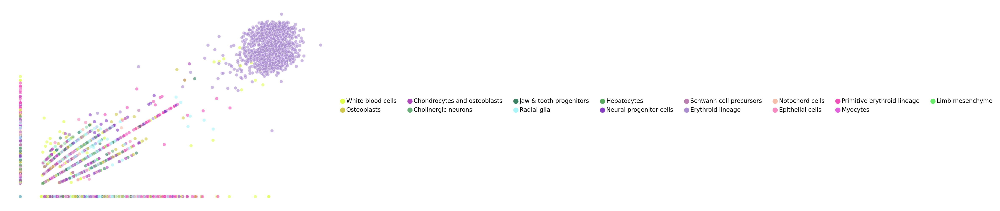

In [53]:
# #Code to just make a legend with more columns

# fig, ax = plt.subplots(nrows = 1, ncols = 1, figsize=(8,5))


# x = count_mat_orig[:,0]
# y = count_mat_orig[:,1]

# namesForCol = pd.unique(adata2.obs['Cluster'])
# palette = {}
# for i in range(len(namesForCol)):
#     palette[namesForCol[i]] = colors[i]

# sns.scatterplot(x, y, s=20, alpha = 0.6,hue=list(adata2.obs['Cluster']), palette = palette) #label=list(cluster_label),

# handles, labels = plt.gca().get_legend_handles_labels()
# #by_label = dict(zip(labels, handles))
# ax.legend(handles, labels,loc='center left',bbox_to_anchor=(1, 0.5),prop={'size': 8},frameon=False,ncol=)
# ax.set_axis_off()

# fig.tight_layout()
# plt.savefig('legend.pdf')


Generate embeddings in 2D using different numbers of neighbors

In [42]:
#Try nn = 15,100, n/100, n/10
#try nn = 30, n/100, n*.05, n/10
latents,latentLab,latentType = latentCompParams(scaled_mat_orig, count_mat_orig, ndims=2, 
                                                neigh=[5,30,50,
                                                       int(np.round(count_mat_orig.shape[0]/100)),int(np.round(count_mat_orig.shape[0]*.05)),int(np.round(count_mat_orig.shape[0]/10))], rounds = 3)




In [37]:
latentLab

['Ambient',
 'PCA 50D UMAP 5',
 'PCA 50D UMAP 30',
 'PCA 50D UMAP 50',
 'PCA 50D UMAP 215',
 'PCA 50D UMAP 1077',
 'PCA 50D UMAP 2155',
 'PCA 50D UMAP 5',
 'PCA 50D UMAP 30',
 'PCA 50D UMAP 50',
 'PCA 50D UMAP 215',
 'PCA 50D UMAP 1077',
 'PCA 50D UMAP 2155',
 'PCA 50D UMAP 5',
 'PCA 50D UMAP 30',
 'PCA 50D UMAP 50',
 'PCA 50D UMAP 215',
 'PCA 50D UMAP 1077',
 'PCA 50D UMAP 2155',
 'PCA 50D']

Get correlations of cell type neighbor rankings to Ambient (with this one parameter difference in each embedding i.e. number of neighbors)

In [44]:
allNeigh = getAllNeigh(latents,latentLab,latentType,adata2.obs['Cluster'])
allNeigh.head()

,Latent,Tau
0,PCA 50D UMAP 5,0.352381
1,PCA 50D UMAP 5,0.523810
2,PCA 50D UMAP 5,0.333333
3,PCA 50D UMAP 5,0.333333
4,PCA 50D UMAP 5,0.409524


In [52]:
allNeigh_l2 = getAllNeigh(latents,latentLab,latentType,adata2.obs['Cluster'],metric='l2')

/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 6.7% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 8.9% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


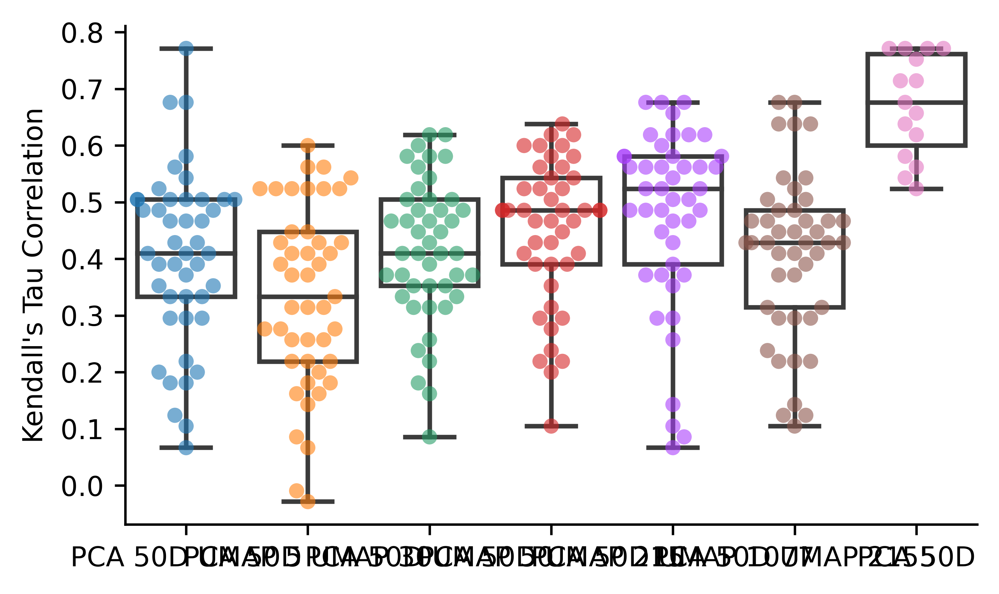

In [51]:
plotNeigh(allNeigh,size=5,axisFontSize = 9,figsize=(5,3))

/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 6.7% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


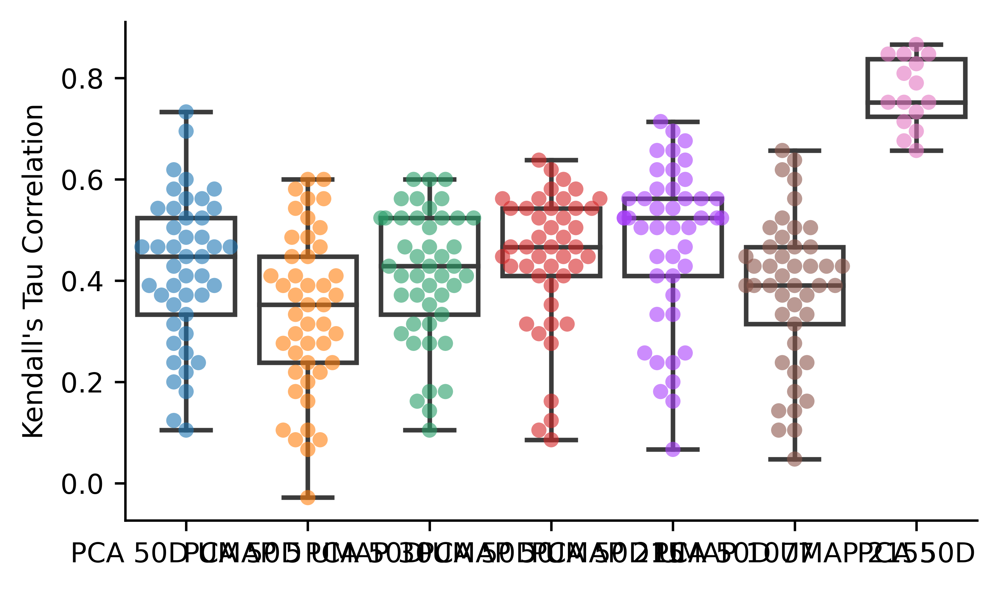

In [53]:
plotNeigh(allNeigh_l2,size=5,axisFontSize = 9,figsize=(5,3))

Get correlations of cell type neighbor rankings between UMAPs (with this one parameter difference)

In [40]:
from itertools import combinations

combos = list(combinations([1,2,3,4,5,6],2))+list(combinations([7,8,9,10,11,12],2))+list(combinations([13,14,15,16,17,18],2))

dfs = []
comparison = []
for d in combos:
  neigh = [getAllNeigh([latents[i] for i in d],[latentLab[i] for i in d],[latentType[i] for i in d],adata2.obs['Cluster'])]
  dfs += neigh
  comparison += [latentLab[list(d)[0]]+'/'+latentLab[list(d)[1]]]*len(neigh[0])
d50 = pd.concat(dfs)
d50['Comparison'] = comparison
d50.head()

,Latent,Tau,Comparison
0,PCA 50D UMAP 30,0.542857,PCA 50D UMAP 5/PCA 50D UMAP 30
1,PCA 50D UMAP 30,0.580952,PCA 50D UMAP 5/PCA 50D UMAP 30
2,PCA 50D UMAP 30,0.466667,PCA 50D UMAP 5/PCA 50D UMAP 30
3,PCA 50D UMAP 30,0.276190,PCA 50D UMAP 5/PCA 50D UMAP 30
4,PCA 50D UMAP 30,0.390476,PCA 50D UMAP 5/PCA 50D UMAP 30


/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 8.9% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 6.7% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


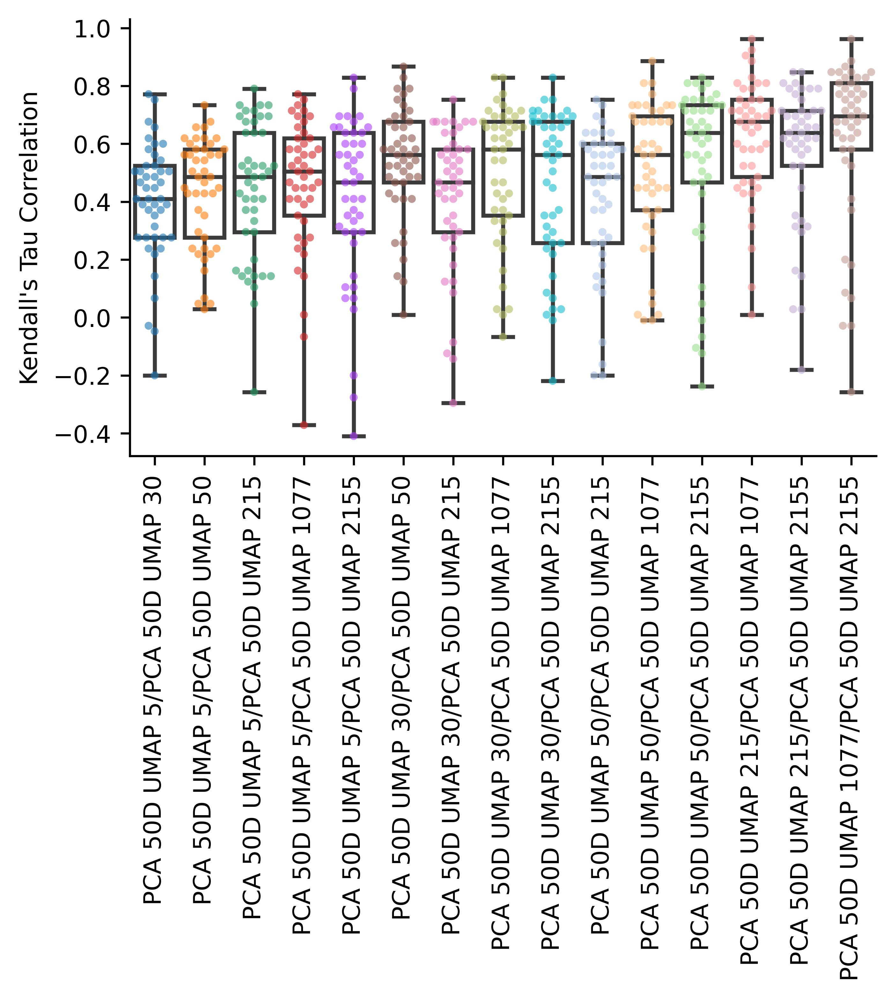

In [48]:
plotNeigh(d50,size=3,axisFontSize = 9,figsize=(5,3),latent='Comparison',rot=True)

In [54]:
from itertools import combinations

combos = list(combinations([1,2,3,4,5,6],2))+list(combinations([7,8,9,10,11,12],2))+list(combinations([13,14,15,16,17,18],2))

dfs = []
comparison = []
for d in combos:
  neigh = [getAllNeigh([latents[i] for i in d],[latentLab[i] for i in d],[latentType[i] for i in d],adata2.obs['Cluster'],metric='l2')]
  dfs += neigh
  comparison += [latentLab[list(d)[0]]+'/'+latentLab[list(d)[1]]]*len(neigh[0])
d50_l2 = pd.concat(dfs)
d50_l2['Comparison'] = comparison
d50_l2.head()

,Latent,Tau,Comparison
0,PCA 50D UMAP 30,0.276190,PCA 50D UMAP 5/PCA 50D UMAP 30
1,PCA 50D UMAP 30,0.828571,PCA 50D UMAP 5/PCA 50D UMAP 30
2,PCA 50D UMAP 30,0.200000,PCA 50D UMAP 5/PCA 50D UMAP 30
3,PCA 50D UMAP 30,0.066667,PCA 50D UMAP 5/PCA 50D UMAP 30
4,PCA 50D UMAP 30,-0.161905,PCA 50D UMAP 5/PCA 50D UMAP 30


/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 15.6% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 8.9% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 6.7% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


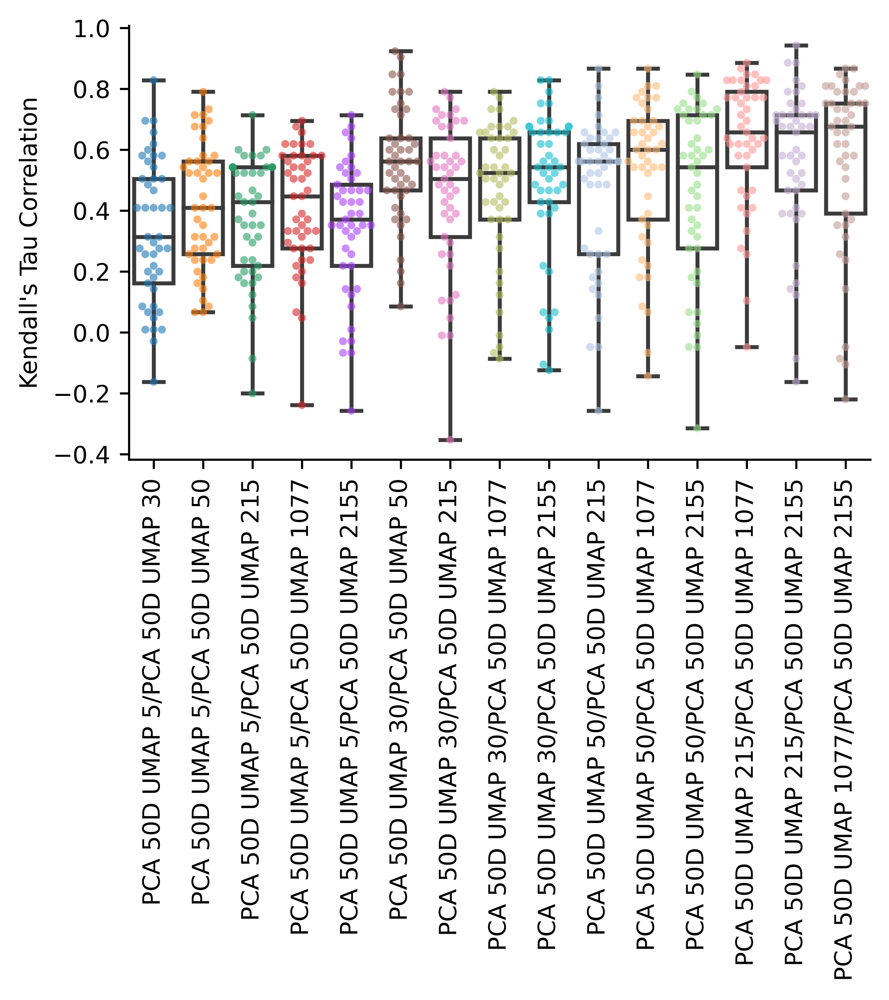

In [55]:
plotNeigh(d50_l2,size=3,axisFontSize = 9,figsize=(5,3),latent='Comparison',rot=True)

In [42]:
namesForCol = pd.unique(adata2.obs['Cluster'])
palette = {}
for i in range(len(namesForCol)):
  palette[namesForCol[i]] = colors[i]


PCA 50D UMAP 5


/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


PCA 50D UMAP 30


/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


PCA 50D UMAP 50


/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


PCA 50D UMAP 215


/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


PCA 50D UMAP 1077


/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


PCA 50D UMAP 2155


/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


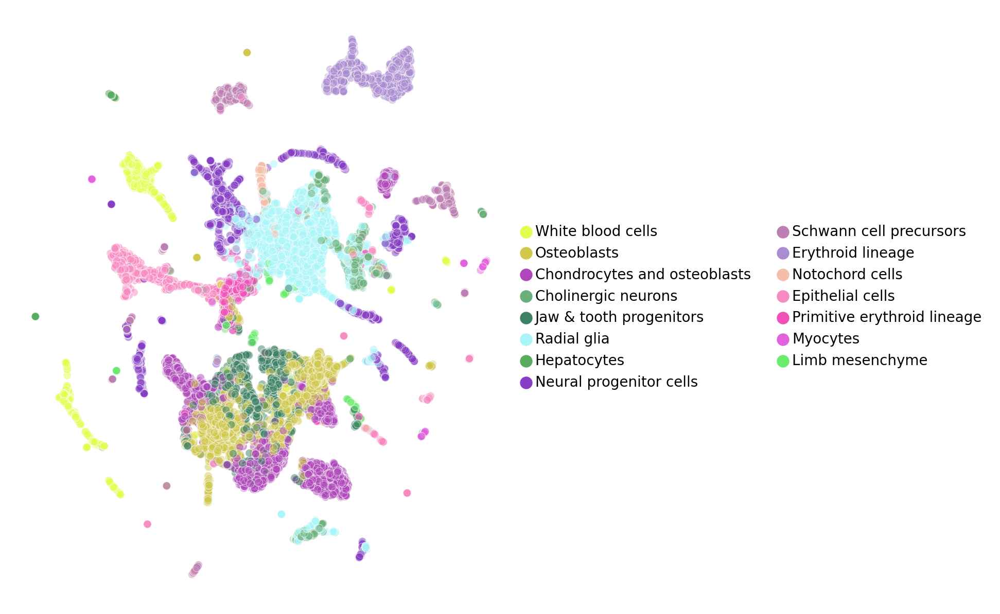

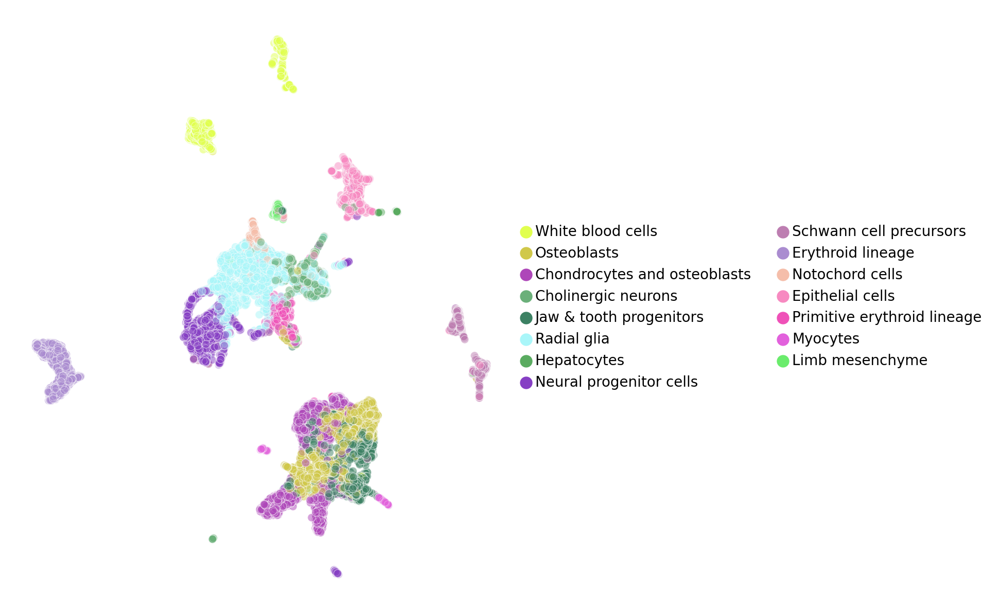

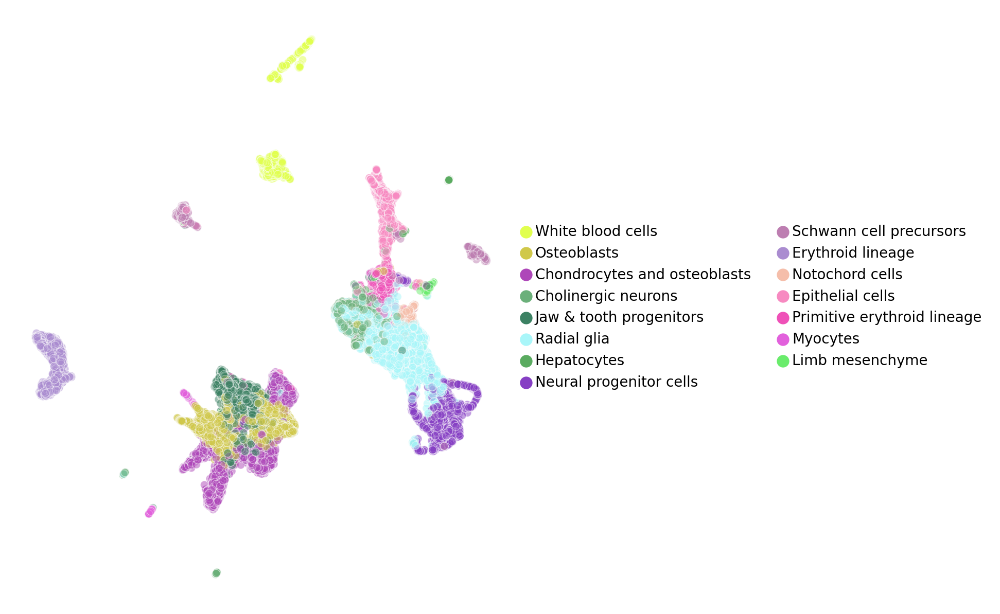

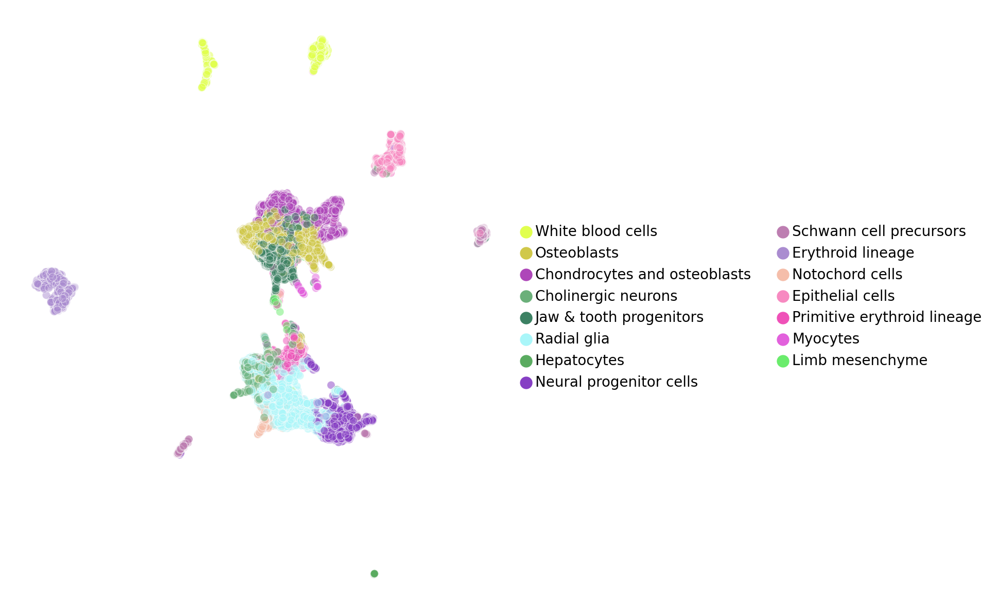

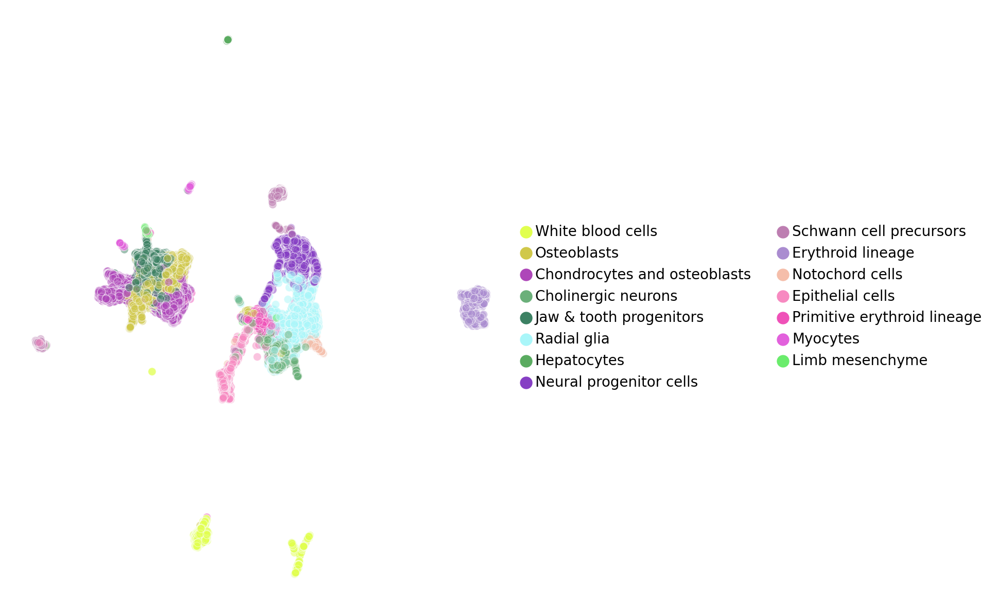

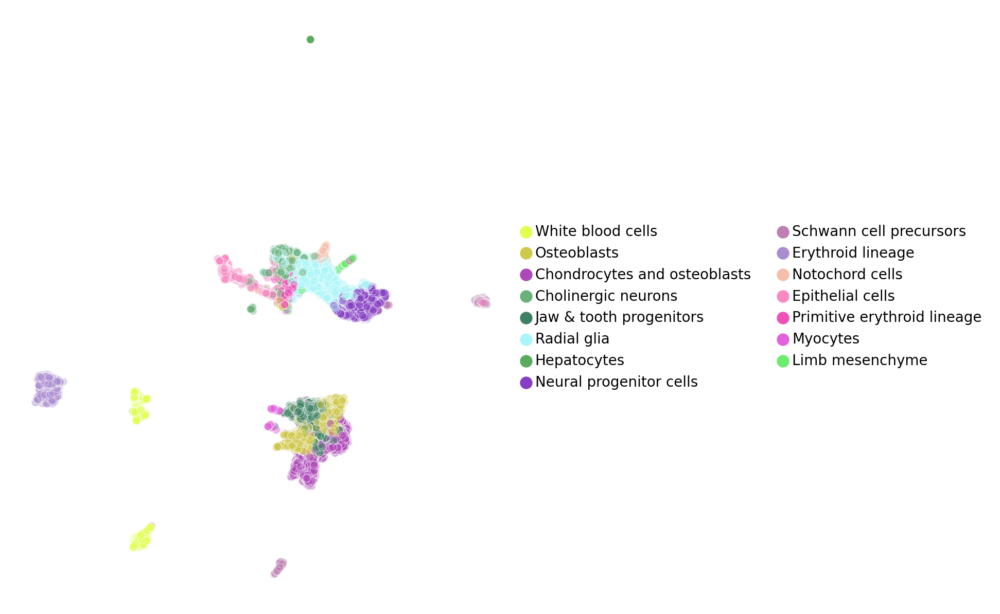

In [43]:
for i in [1,2,3,4,5,6]: #Choose random umaps to compare
  print(latentLab[i])
  obj_plot_embed(latents[i], adata2.obs['Cluster'], fname = 'inutero_'+str(i)+'_'+str(latentLab[i])+'_UMAP.pdf', palette=palette,alpha= 0.5,figsize=(8,5))
    

PCA 50D UMAP 5


/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


PCA 50D UMAP 30


/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


PCA 50D UMAP 50


/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


PCA 50D UMAP 215


/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


PCA 50D UMAP 1077


/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


PCA 50D UMAP 2155


/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


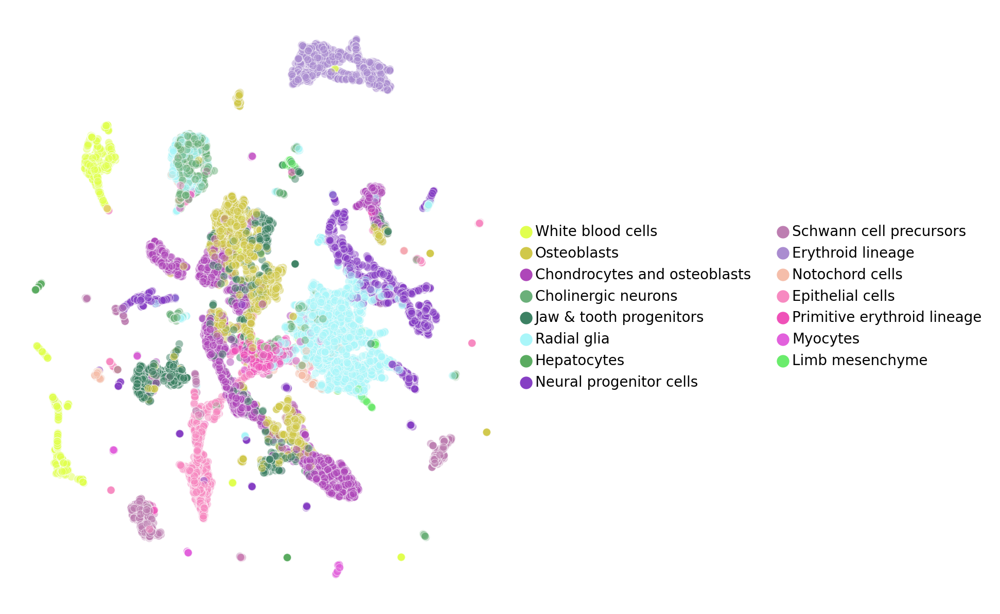

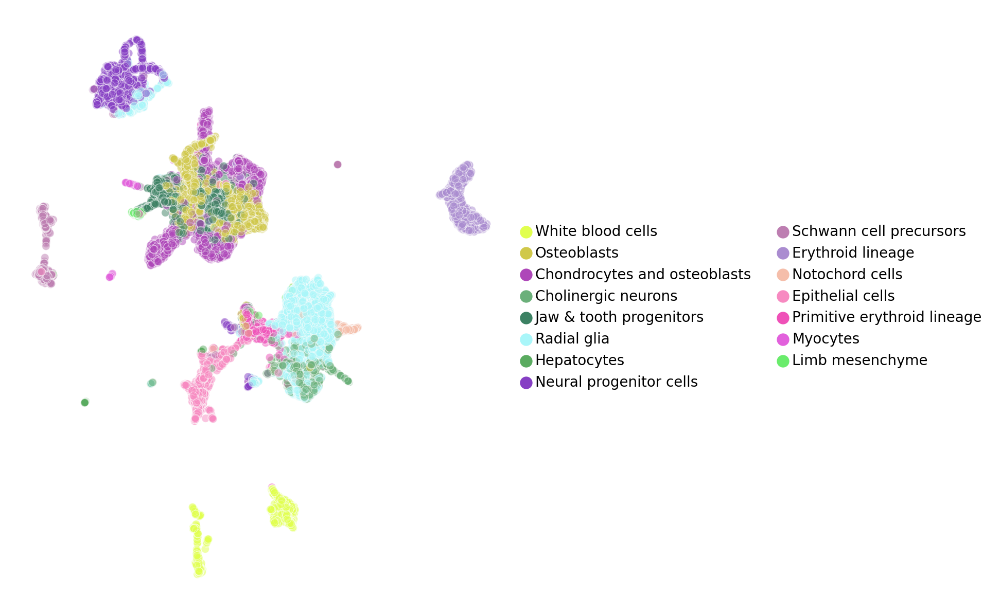

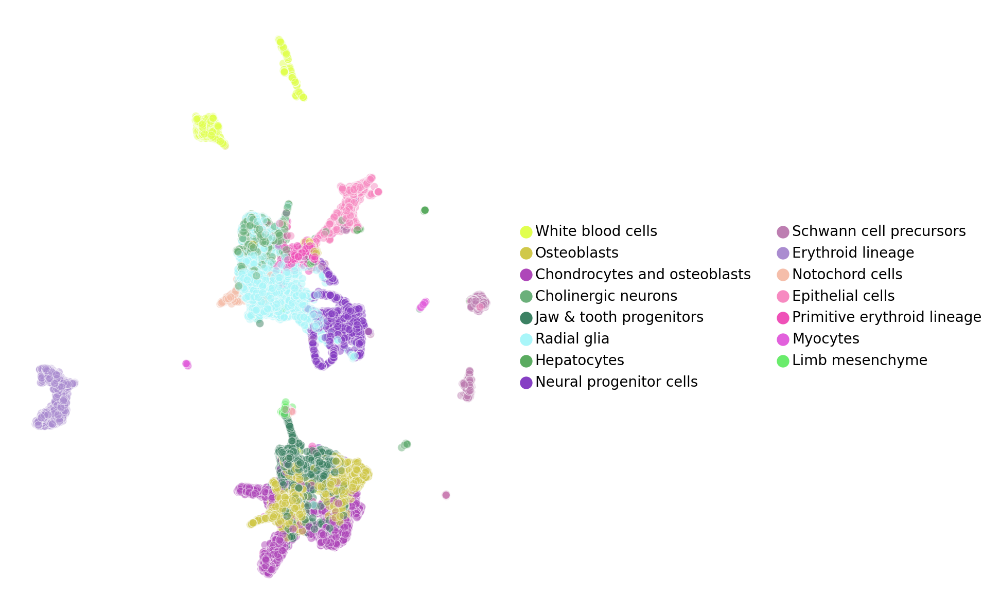

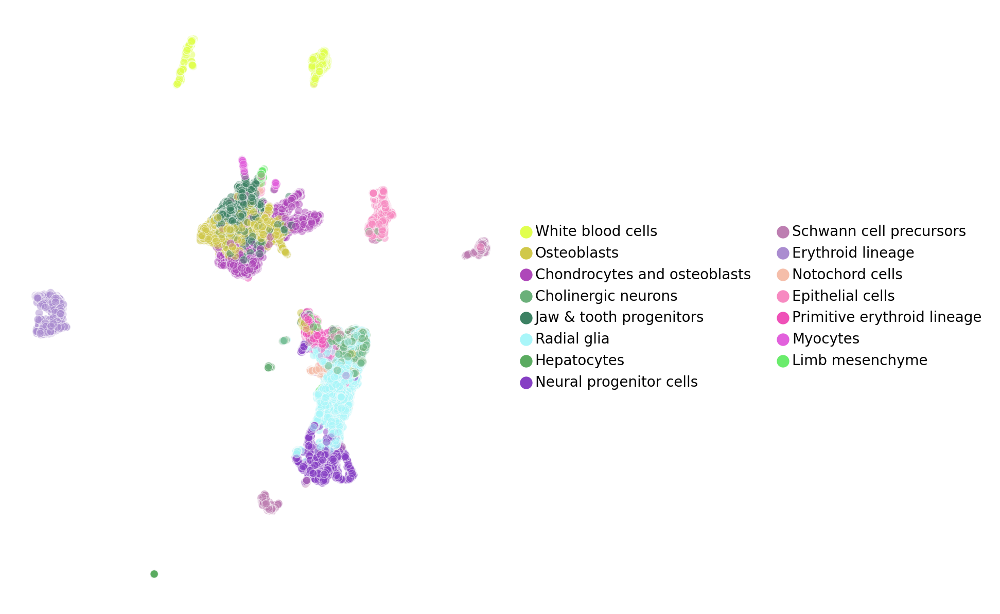

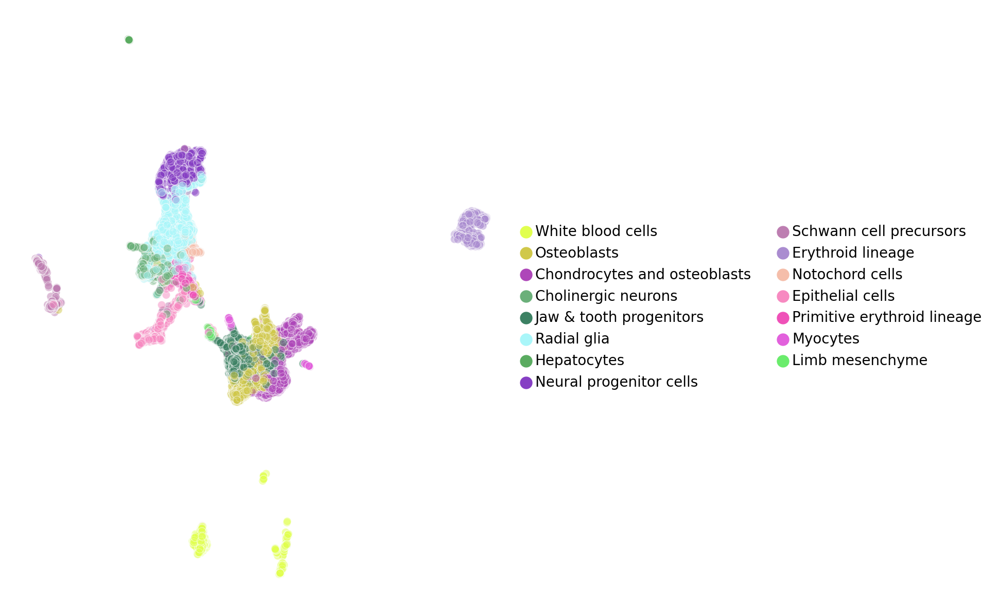

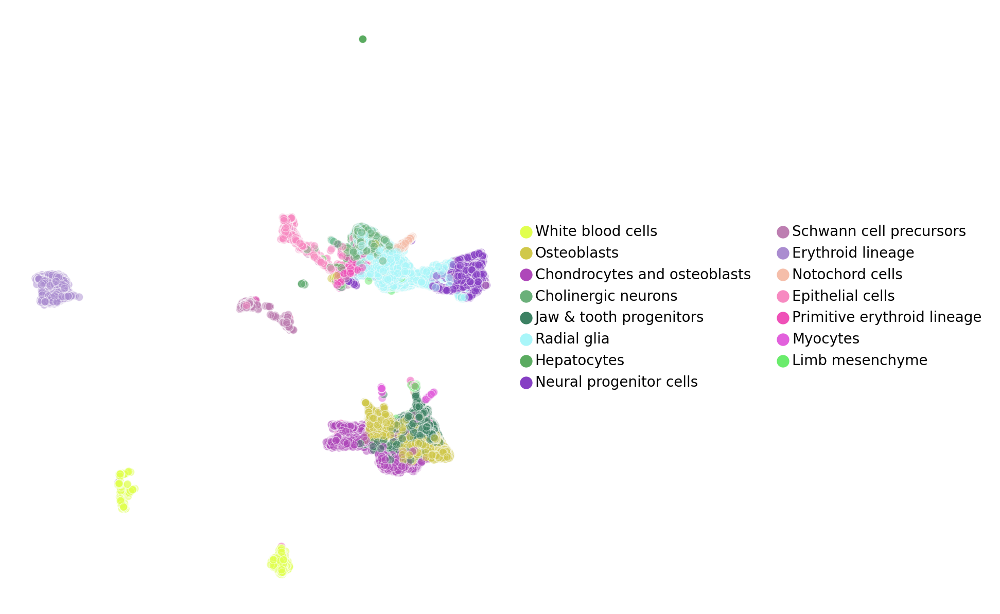

In [44]:
for i in [7,8,9,10,11,12]: #Choose random umaps to compare
  print(latentLab[i])
  obj_plot_embed(latents[i], adata2.obs['Cluster'], fname = 'inutero_'+str(i)+'_'+str(latentLab[i])+'_UMAP.pdf', palette=palette,alpha= 0.5,figsize=(8,5))
    

Flip plot coloring and See how kmeans clustering does

In [53]:
from sklearn.cluster import KMeans

PCA 50D UMAP 30


/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


PCA 50D UMAP 215


/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


PCA 50D UMAP 1077


/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


PCA 50D UMAP 2155


/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


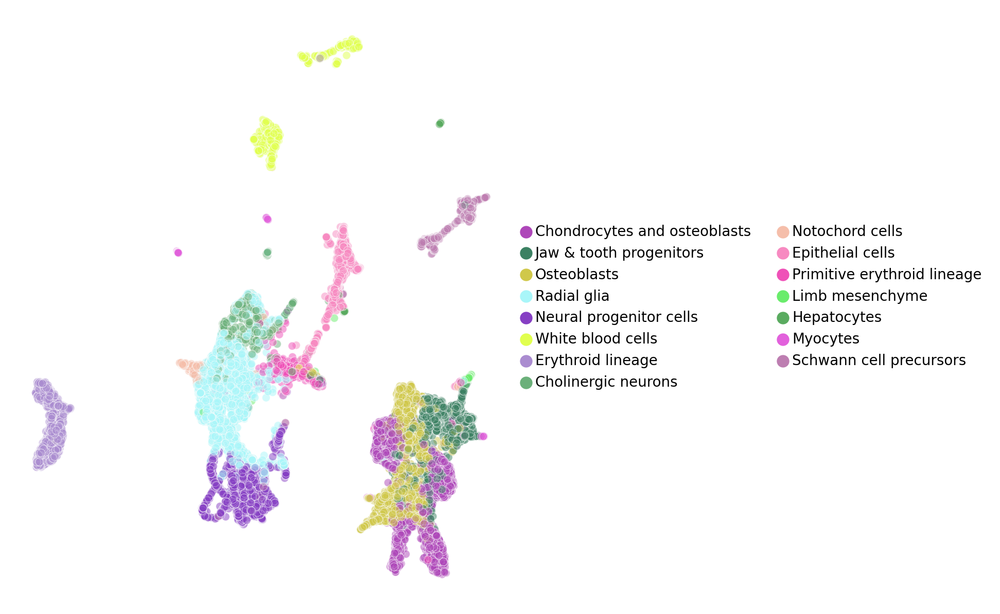

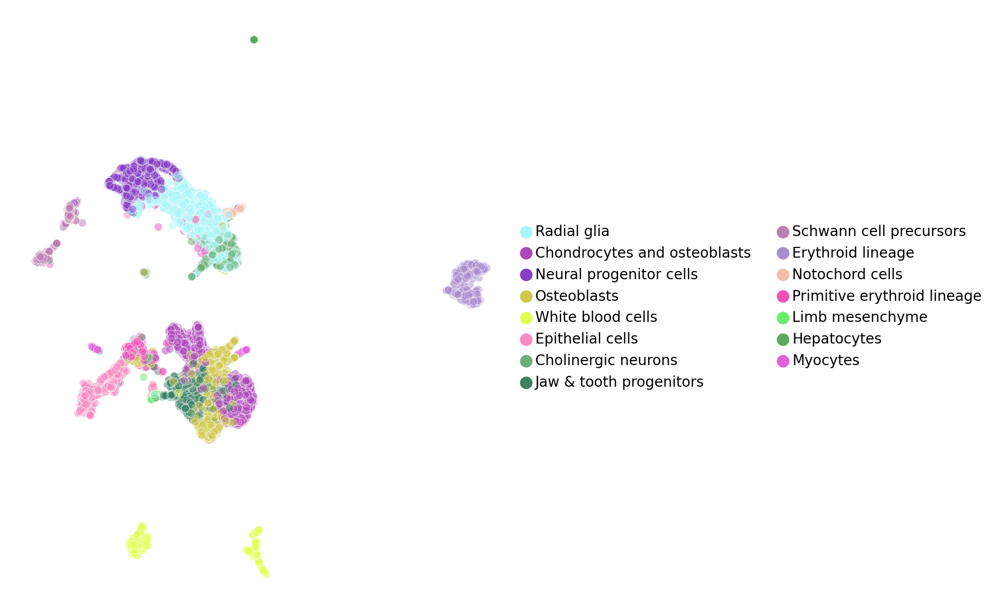

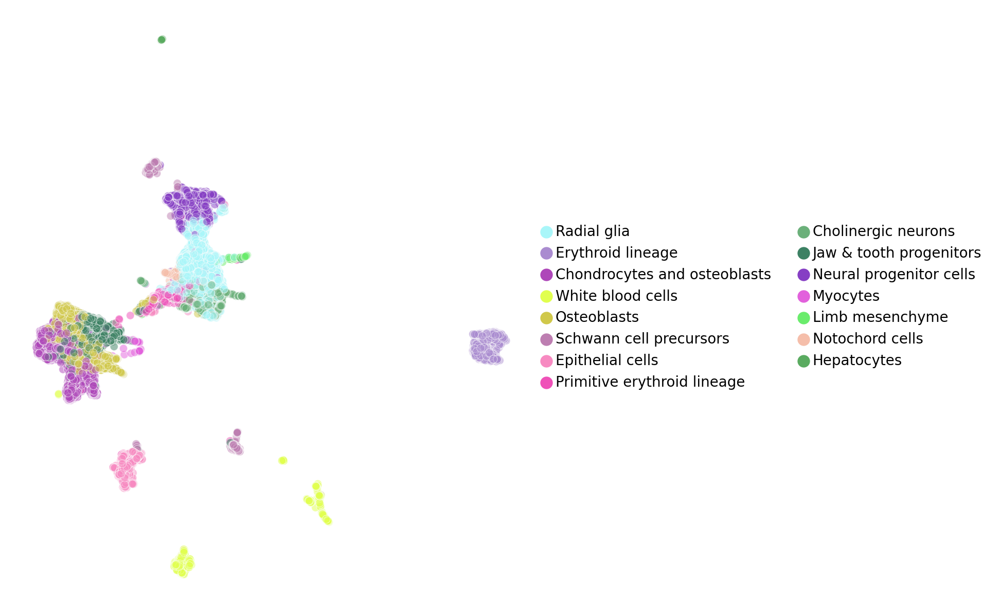

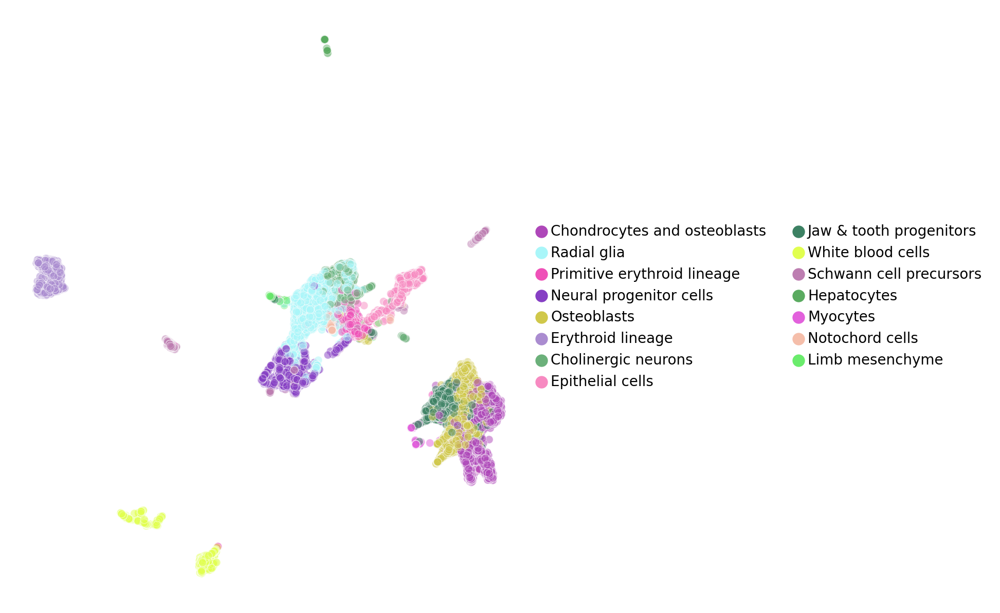

In [58]:
#colorsFlip = [palette[i] for i in pd.unique(adata2.obs['Cluster'][::-1])]
#This is just randomly shuffling cell indices

for i in [1,6,11,4]:
  print(latentLab[i])
  obj_plot_embed_flip(latents[i], adata2.obs['Cluster'], fname = 'flip_inutero_'+str(latentLab[i])+'_UMAP.pdf' , palette=palette,alpha= 0.5,figsize=(8,5))
    

/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or mis

/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or mis

/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or mis

/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or mis

/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or mis

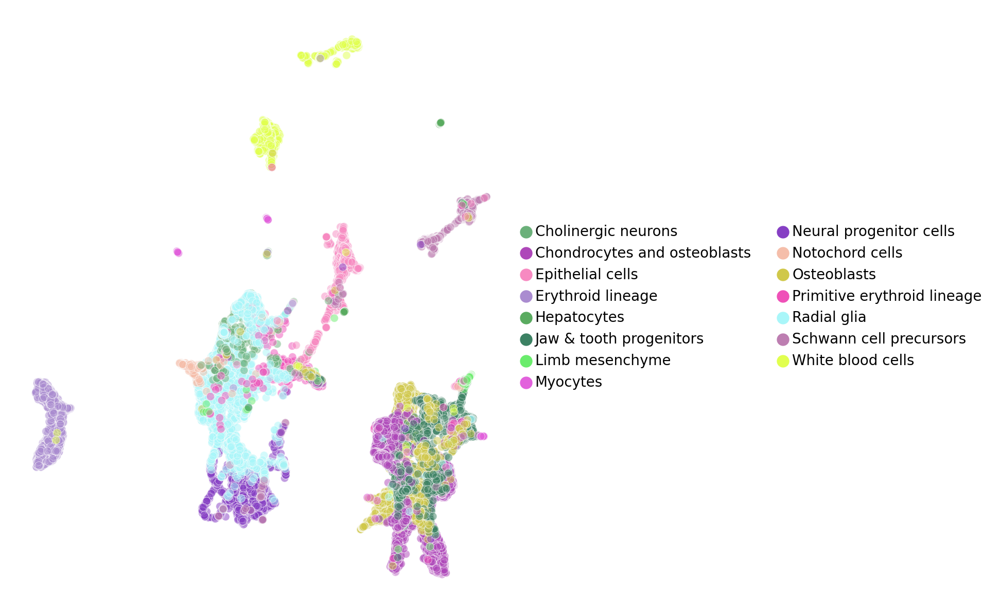

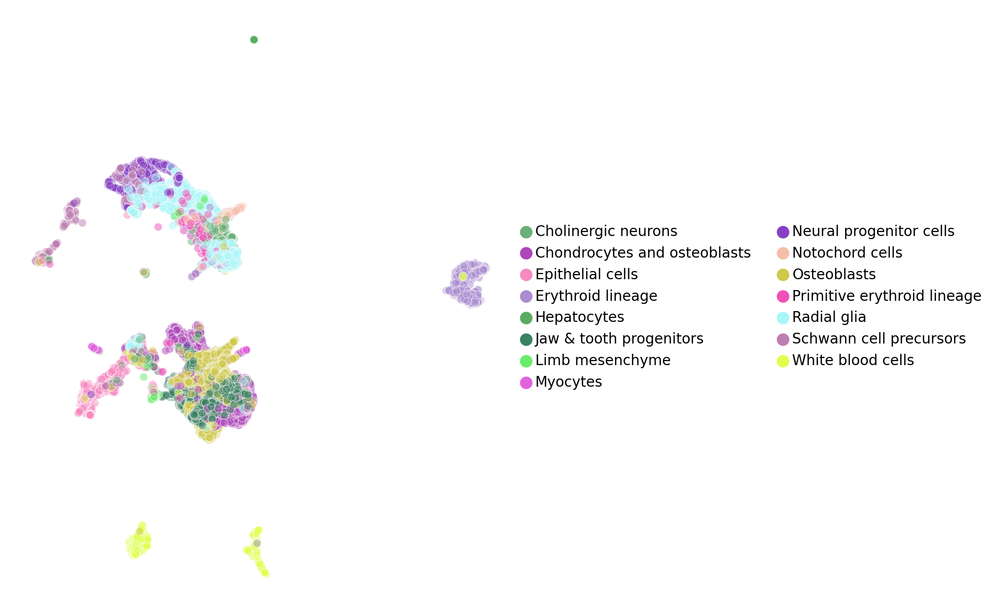

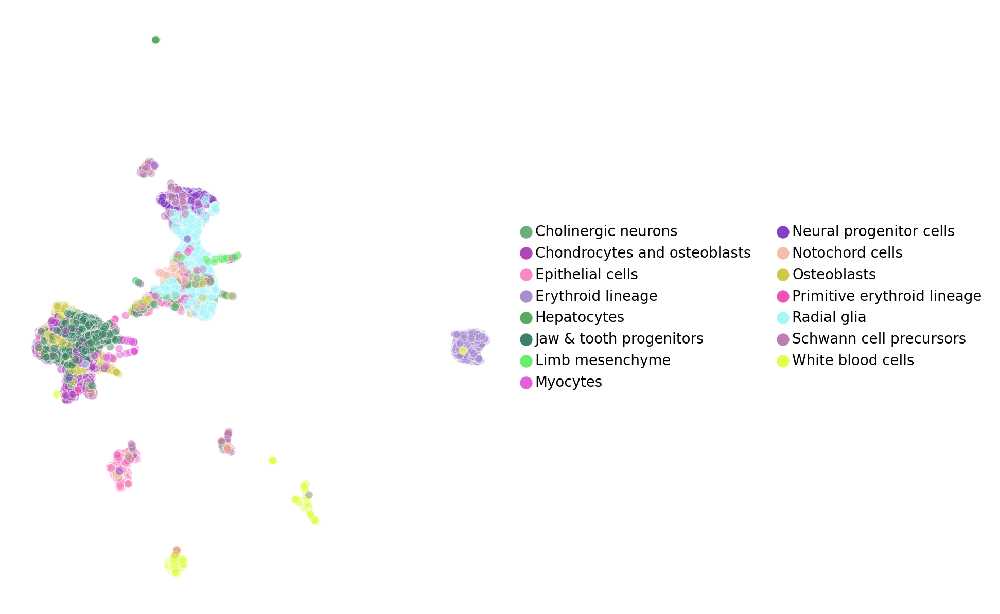

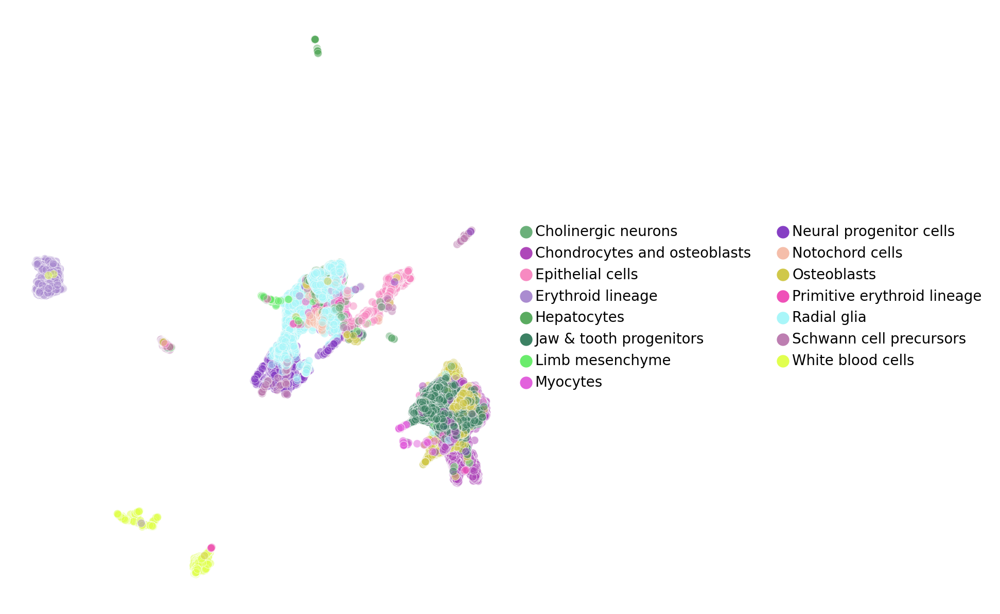

In [89]:
allKmeansLabs = []
for i in [1,6,11,4]:
    kmeans_model_umap = KMeans(n_clusters=len(np.unique(adata2.obs['Cluster'])), random_state=42).fit(latents[i])
    labelsUMAP = kmeans_model_umap.labels_
    allKmeansLabs += [labelsUMAP]

    #plot covered cells on top
    plotOnTop(latents[i],palette,labelsUMAP,adata2.obs['Cluster'], size=20,figsize=(8,5),fname = 'onTop_inutero_'+str(latentLab[i])+'_UMAP.pdf')


  #plotOnTop(latents[i],palette,labelsUMAP,adata2.obs['Cluster'], size=5)
  #vis.obj_plot_embed(latents[i], meta.smartseq_cluster, fname = '2DNCA.pdf', colors=clus_colors )

In [61]:
len(allKmeansLabs)

4

/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or mis

0.7374055970424747


/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or mis

0.7567732099101386


/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or mis

0.7426428123252242


/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/home/tchari/miniconda3/envs/py37/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or mis

0.7482619305426332


,Cluster,Fraction,Embedding
0,White blood cells,0.610535,PCA 50D UMAP 30
1,Osteoblasts,0.423256,PCA 50D UMAP 30
2,Chondrocytes and osteoblasts,0.430153,PCA 50D UMAP 30
3,Cholinergic neurons,0.914754,PCA 50D UMAP 30
4,Jaw & tooth progenitors,0.639864,PCA 50D UMAP 30


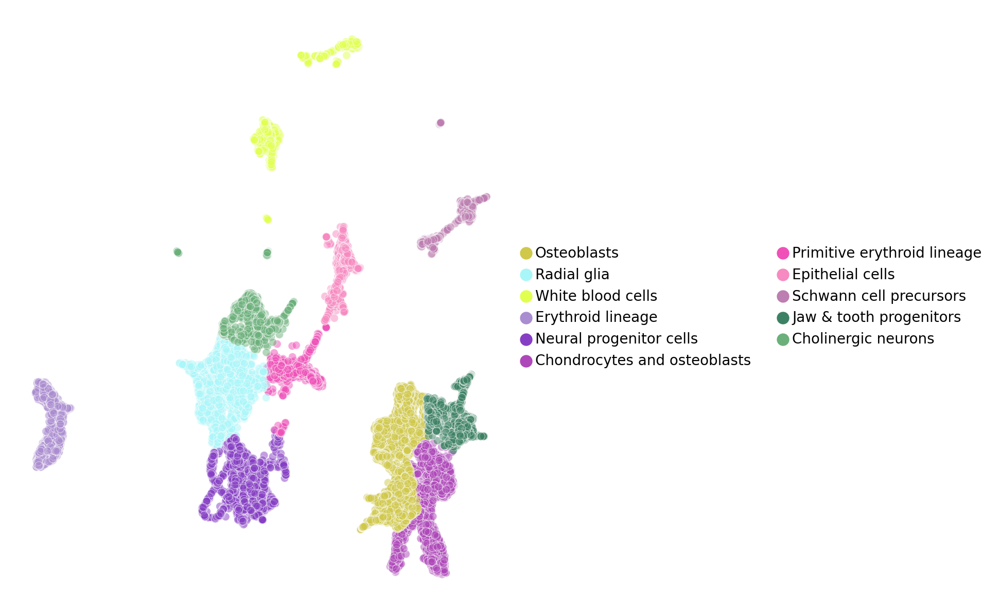

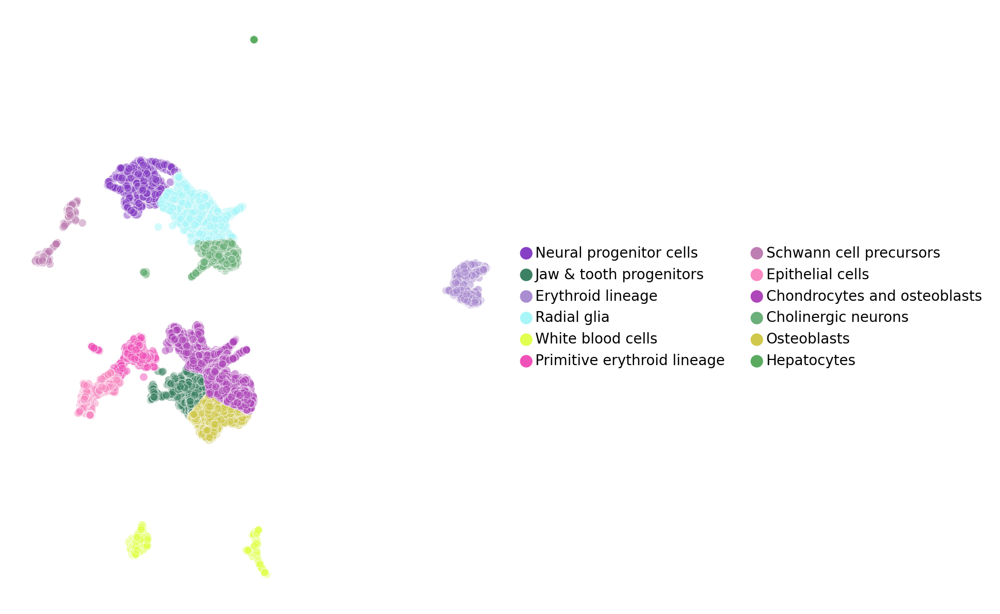

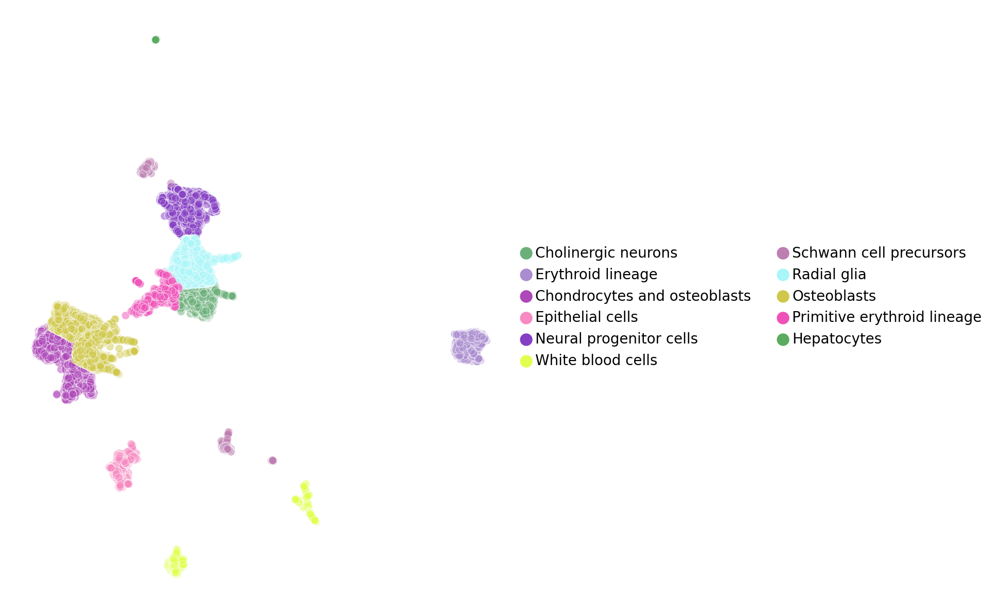

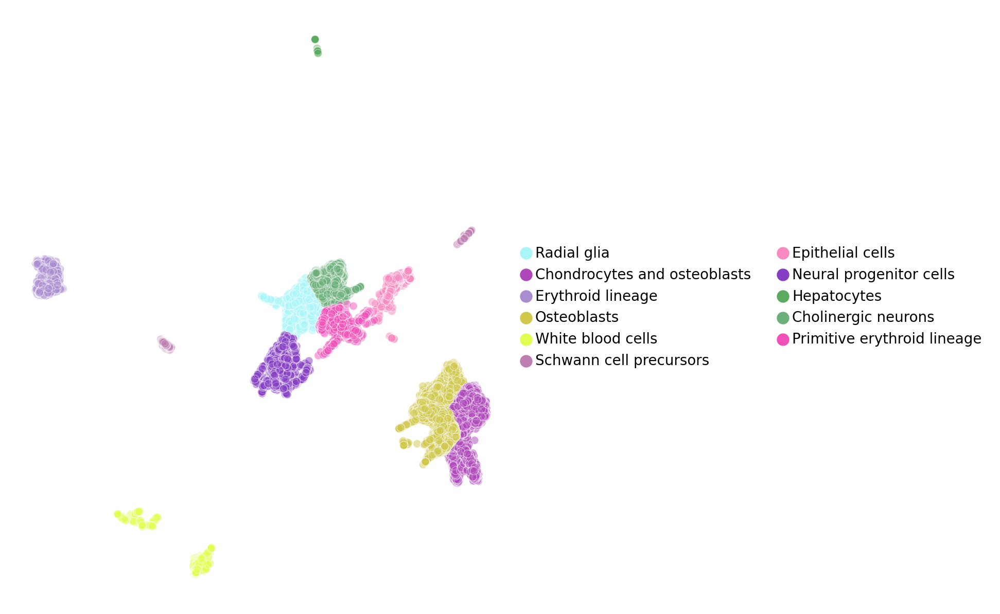

In [91]:
#UMAP
df = []
umaps = [1,6,11,4]
for i in range(len(allKmeansLabs)):
    means = [getKMeans(allKmeansLabs[i],adata2.obs['Cluster'],latentLab[umaps[i]])]
    df += means
    plotKmeans(latents[umaps[i]],palette,allKmeansLabs[i],adata2.obs['Cluster'], size=20,figsize=(8,5),fname='kmeans_inutero_'+str(latentLab[umaps[i]])+'_UMAP.pdf')

    print(np.mean(means[0].Fraction))

dAll = pd.concat(df)
dAll.head()

In [69]:
dAll

,Cluster,Fraction,Embedding
0,White blood cells,0.608808,PCA 50D UMAP 15
1,Osteoblasts,0.441503,PCA 50D UMAP 15
2,Chondrocytes and osteoblasts,0.416809,PCA 50D UMAP 15
3,Cholinergic neurons,0.763934,PCA 50D UMAP 15
4,Jaw & tooth progenitors,0.409966,PCA 50D UMAP 15
5,Radial glia,0.524387,PCA 50D UMAP 15
6,Hepatocytes,0.946429,PCA 50D UMAP 15
7,Neural progenitor cells,0.901990,PCA 50D UMAP 15
8,Schwann cell precursors,0.553757,PCA 50D UMAP 15
9,Erythroid lineage,0.998810,PCA 50D UMAP 15


In [49]:
!zip inutero.zip *inutero*.pdf

updating: flip_inutero_PCA 50D UMAP 100_UMAP.pdf (deflated 1%)
updating: flip_inutero_PCA 50D UMAP 15_UMAP.pdf (deflated 1%)
updating: flip_inutero_PCA 50D UMAP 2155_UMAP.pdf (deflated 1%)
updating: flip_inutero_PCA 50D UMAP 215_UMAP.pdf (deflated 1%)
updating: inutero_PCA 50D UMAP 100_UMAP.pdf (deflated 1%)
updating: inutero_PCA 50D UMAP 15_UMAP.pdf (deflated 1%)
updating: inutero_PCA 50D UMAP 2155_UMAP.pdf (deflated 1%)
updating: inutero_PCA 50D UMAP 215_UMAP.pdf (deflated 1%)
updating: kmeans_inutero_Ambient_UMAP.pdf (deflated 4%)
updating: kmeans_inutero_PCA 50D UMAP 100_UMAP.pdf (deflated 4%)
updating: kmeans_inutero_PCA 50D UMAP 15_UMAP.pdf (deflated 4%)
updating: kmeans_inutero_PCA 50D UMAP 2155_UMAP.pdf (deflated 3%)
updating: kmeans_inutero_PCA 50D UMAP 215_UMAP.pdf (deflated 3%)
updating: onTop_inutero_PCA 50D UMAP 100_UMAP.pdf (deflated 4%)
updating: onTop_inutero_PCA 50D UMAP 15_UMAP.pdf (deflated 4%)
updating: onTop_inutero_PCA 50D UMAP 2155_UMAP.pdf (deflated 4%)
updating